# Исследование рынка заведений общественного питания Москвы

## Цель и задачи исследования

**Цель:** исследование рынка заведений общественного питания Москвы для того, чтобы найти особенности, которые в будущем помогут в выборе подходящего места для открытия кофейни.

**Заказчик:** инвесторы фонда.

**Задачи:**
- исследовать особенности заведений общепита в Москве;
- разработать рекомендации для открытия кофейни в Москве.

**План работ:**
- Общий анализ данных о заведениях общественного питания в Москве;
- Проверить и заполнить пропуски данных там, где это возможно;
- Проверить наличие явных и неявных дубликатов и очистить от них данные при необходимости;
- Провести общий анализ параметров заведений, построить и проверить гипотезы об их взаимосвязях;
- Исследовать особенности заведений в категории "кофейня".

**Описание данных:**

В работе используем датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Общая информация о файле

In [516]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
from folium import Marker, Map, Choropleth
from folium.plugins import MarkerCluster

In [517]:
moscow_places = pd.read_csv('moscow_places.csv')
display(moscow_places.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [518]:
print(moscow_places.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None


**Вывод:**
 - в работу взяли датафрейм, который состоит из 14 колонок, в 6 из которых есть пропуски данных, к которым вернемся в дальшейших этапах.

## Проверка пропусков данных

In [519]:
print(moscow_places.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


- Пропущены значения в 6 столбцах из 14. Заполнить пропуски в столбах hours, avg_bill, middle_avg_bill, middle_coffee_cup, seats расчетными значениями не представляется возможными.
- Заполним часть пропусков столюца `price` для тех строк, где указаны значения среднего чека `middle_avg_bill`.
Для этого вычислим диапазоны, в которые попадают значения, определяющие price как низкий, средний, выше среднего и высокий:
1. Найдем минимальные и максимальные знаечния в группах по данным параметрам;
2. Построим графики распределения значений, чтобы найти выбросы и/или пересекающиеся значений;
3. Определеим корректные диапазоны, исключив пересечения.

In [520]:
moscow_places.groupby('price')['middle_avg_bill'].min().rename('middle_avg_bill_min').to_frame()

,middle_avg_bill_min
price,
высокие,0.0
выше среднего,375.0
низкие,90.0
средние,165.0


In [521]:
moscow_places.groupby('price')['middle_avg_bill'].max().rename('middle_avg_bill_max').to_frame()

,middle_avg_bill_max
price,
высокие,35000.0
выше среднего,4500.0
низкие,600.0
средние,2150.0


In [522]:
moscow_places['price'].value_counts().to_frame()

,price
средние,2117
выше среднего,564
высокие,478
низкие,156


Проверим распределение диапазонов значений по категориям price.

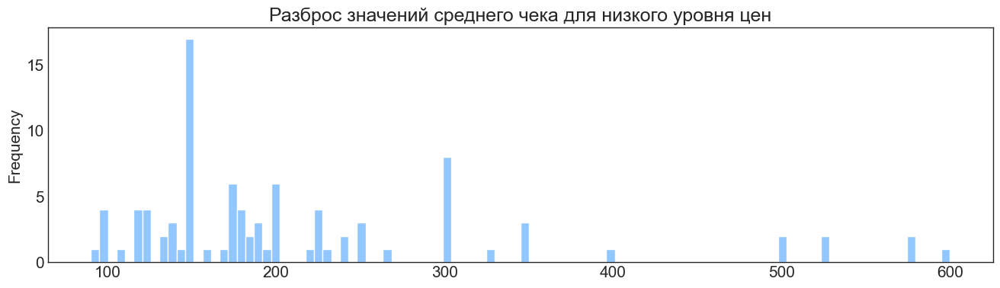

In [523]:
moscow_places[moscow_places['price'] == 'низкие']['middle_avg_bill'].plot(
                                                                    kind='hist', \
                                                                    bins=100, \
                                                                    figsize=(16, 4),
                                                title='Разброс значений среднего чека для низкого уровня цен');

Для значений price обозначенных как низкие видим разброс от 90 до 600 рублей, причем значения в 500-600 единичны, примем их как выбросы и обозначим за диапазон средний чек 90 - 400 рублей.

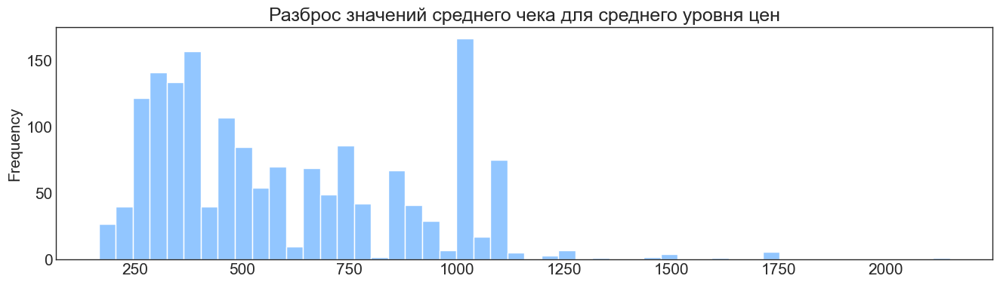

In [524]:
moscow_places[moscow_places['price'] == 'средние']['middle_avg_bill'].plot(
                                                                    kind='hist', \
                                                                    bins=50, \
                                                                    figsize=(16, 4),
                                                title='Разброс значений среднего чека для среднего уровня цен');

Для "среднего" чека видим суммы от 120 до чуть более 2000 рублей. Стартовые значения при этом пересекаются с цифрами, обозначенными как "низкий" price на графике выше. Чтобы убрать неоднозначность трактования суммы среднего чека, руководствуясь здравым смыслом, примем значения price как "средние", стартующие с 400 рублей, а все что меньше, отнесем к категории "низкий". Верхней границей категории price возьмем 1200, значений с большей суммой - единицы.

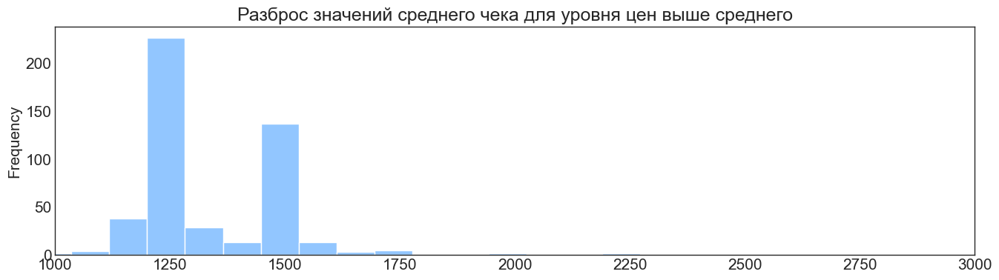

In [525]:
moscow_places[moscow_places['price'] == 'выше среднего']['middle_avg_bill'].plot(
                                                                    kind='hist', \
                                                                    bins=50, \
                                                                    figsize=(16, 4), xlim=(1000, 3000),
                                        title='Разброс значений среднего чека для уровня цен выше среднего');

Диапазон значений price "выше среднего" 1200 - 1700, а все значения больше 1700 отнесем к категории "высокий" price.

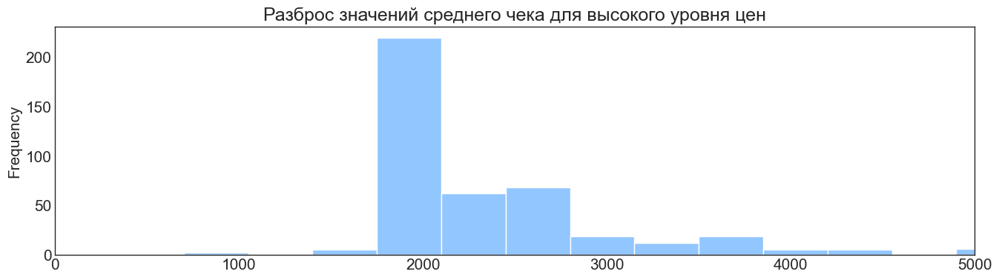

In [526]:
moscow_places[moscow_places['price'] == 'высокие']['middle_avg_bill'].plot(
                                                                    kind='hist', \
                                                                    bins=100, \
                                                                    figsize=(16, 4), \
                                                                    xlim=(0, 5000),
                                            title='Разброс значений среднего чека для высокого уровня цен');

In [527]:
df_category = moscow_places['price'].value_counts().reset_index()
df_category

,index,price
0,средние,2117
1,выше среднего,564
2,высокие,478
3,низкие,156


In [528]:
price_before = moscow_places['price'].value_counts().reset_index()

fig = go.Figure(data=[go.Pie(labels=price_before['index'], values=price_before['price'])])
fig.update_layout(title='Распределение значений по группам price. Исходные данные',
                 width=600,
                  height=400)
fig

In [529]:
moscow_places['price'] = moscow_places['price'].where((
    moscow_places['middle_avg_bill'] > 400) | (
    moscow_places['middle_avg_bill'].isna()), 'низкие')

In [530]:
moscow_places['price'] = moscow_places['price'].where(((
    moscow_places['middle_avg_bill'] <= 400) | (
    moscow_places['middle_avg_bill'] > 1200) | (
    moscow_places['middle_avg_bill'].isna())), 'средние')

In [531]:
moscow_places['price'] = moscow_places['price'].where(((
    moscow_places['middle_avg_bill'] <= 1200) | (
    moscow_places['middle_avg_bill'] > 1700)) | (
    moscow_places['middle_avg_bill'].isna()), 'выше среднего')

In [532]:
moscow_places['price'] = moscow_places['price'].where((
    moscow_places['middle_avg_bill'] <= 1700) | (
    moscow_places['middle_avg_bill'].isna()), 'высокие')

In [533]:
price_after = moscow_places['price'].value_counts().reset_index()

fig = go.Figure(data=[go.Pie(labels=price_after['index'], values=price_after['price'])])
fig.update_layout(title='Распределение значений по группам price. После корректировки',
                width=600,
                height=400)
fig

После корректировки диапазонов значений столбца price увеличилась доля "низких" чеков за счет уменьшения доли чеков среднего уровня. Соотношение долей выше среднего и высоких значей осталось примерно на том же уровне.

In [534]:
print(moscow_places.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                4621
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


**Вывод:** 
- пропущены значения в 6 столбцах из 14. Заполнить пропуски в столбах hours, avg_bill, middle_avg_bill, middle_coffee_cup, seats расчетными значениями не представляется возможными;
- скорректировали диапазоны значений "низкий"(было 90 - 600 , стало 90 - 400), "средний" (было 165 - 2150 , стало 401 - 1300), "выше среднего"(было 375 - 4500 , стало 1301 - 2500) и "высокий"(было 0 - 35000 , стало более 2500) для столбца `price`, убрав тем самым пересечения и противоречия в исходных данных;
- заполнили часть пропусков столбца `price` для тех строк, где указаны значения среднего чека `middle_avg_bill` на основании вышеописанных диапазонов.

## Проверка наличия явных и неявных дубликатов 
Проверим, есть ли в данных явные и неявные дубликаты.

In [535]:
moscow_places[moscow_places.duplicated(['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [536]:
moscow_places.duplicated().sum()

0

**Вывод:** 
- дублирующих значений в сумме столбцов `name` и `address` не обнаружено;
- явных строк-дубликатов не обнаружено.

## Добавление новых столбцов
- создадим столбец street с названиями улиц из столбца с адресом.
- создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.


In [537]:
# создадим новый столбец с использованием регулярных выражений
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
moscow_places["street"] = moscow_places["address"].str.extract(str_pat)
moscow_places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [538]:
def is_24(a):
    return ('круглосуточно' in str(a)) & ('ежедневно' in str(a))
moscow_places['is_24_7'] = moscow_places['hours'].apply(is_24)
moscow_places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


**Вывод:**
- в таблицу добавлен столбец `street`, в котором отдельно от общего адреса хранятся названия улиц, где расположены заведения общепита;
- в датасет добавлен столбец `is_24_7`, где хранятся данные о том, работает ли заведение круглосуточно и ежедневно.

## Анализ параметров заведений общественного питания Москвы

### Распределение заведений по категориям

Посмотрим, как соотносятся разные типы категорий заведений общественного питания: кто занимает большую долю, а кто представлен меньшим количеством.

In [539]:
moscow_places_cat_count = moscow_places['category'].value_counts().reset_index()

fig = px.bar(moscow_places_cat_count, 
             x='category', 
             y='index', 
             text='category' 
            )

fig.update_layout(title='Количество заведений общественного питания по категориям',
                   xaxis_title='Количество заведений в категории',
                   yaxis_title='Категория заведения')
fig

In [540]:
df_category = pd.DataFrame(moscow_places['category'].value_counts()).reset_index()

fig = go.Figure(data=[go.Pie(labels=df_category['index'], values=df_category['category'])])
fig.update_layout(title='Распределение заведений по категориям',
                 width=600,
                  height=500)
fig

По количеству заведений и доле лидирует категория "кафе" и недалеко от нее "ресторан" - более 52.6% рынка заведений общественно питания приходится на долю этих категорий. Кофеен 16.8% от общего количества заведений общепита в Москве;
Замыкают рейтинг столовые и булочные - заведений этих типов меньше всего в Москве - 3.75 и 3.05% соответственно.

In [541]:
moscow_places_cat_seats = moscow_places \
                                .groupby('category')['seats'].median() \
                                .apply(round).reset_index() \
                                .sort_values('seats', ascending=False)

fig = px.bar(moscow_places_cat_seats, 
             x='category', 
             y='seats', 
             text='seats' 
            )

fig.update_layout(title='Медиана количества посадочных мест в разных категориях заведений',
                   xaxis_title='Категория заведения',
                   yaxis_title='Медиана количества посадочных мест')
fig

**Выводы:**
- преобладающая доля заведений общественно питания в Москве - это кафе, 28.3%, или 2 378 заведений;
- менее всего столовых(315 заведений) и булочных(256 заведений), что составляет 3.75 и 3.05% соответственно;
- в ресторанах, барах и кофейнях похожее медианное значение количества посадочных мест - 86 - 80 мест;
- менее всего посадочных мест в булочных - 50.

### Сетевые и не сетевые заведения

Рассмотрим соотношение сетевых и несетевых заведений в датасете.

In [542]:
moscow_places_chain_count = moscow_places.groupby('chain')['name'].count().reset_index()
moscow_places_chain_count['chain'] = moscow_places_chain_count['chain'].map(
                                                                            {0: 'несетевые',
                                                                             1 : 'сетевые'})
fig = go.Figure(data=[go.Pie(
                        labels=moscow_places_chain_count['chain'],
                        values=moscow_places_chain_count['name'])])
fig.update_layout(title='Соотношение сетевых и несетевых заведений',
                  width=600,
                  height=400)
fig

In [543]:
moscow_places_chain = moscow_places.groupby(['category','chain'])['name'].count().reset_index()
moscow_places_chain['chain'] = moscow_places_chain['chain'].map({0: 'несетевые', 1 : 'сетевые'})

fig = px.bar(moscow_places_chain.sort_values('name'), 
             x='name', 
             y='category',
             color='chain',
             text='name'
            )

fig.update_layout(title='Соотношение сетевых и несетевых заведений в категории',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория заведения')
fig

**Выводы:**
- датасете преобладают несетевые заведения, они составляют 61.9% от выборки;
- выделяются 3 категории, где количество сетевых заведений превышает количество несетевых - это кофейня, пиццерия и булочная;
- в кафе в ресторанах похожая между собой картина - несетевых заведений примерно  вдвое больше, чем сетевых;
- несетевых баров значительно больше, чем сетевых, что можно объяснить желанием владельцев баров и пабов сделать свои заведния уникальными.

### Топ-15 популярных сетей в Москве

Найдем топ-15 популярных сетей в Москве. Под популярностью будем понимать общее количество заведений этой сети в регионе. 
Исследуем особенности их параметров.

In [544]:
# соберем данные для визуализации
top_15_places = (moscow_places.query('chain == 1').groupby(['name', 'category'])) \
                                     .agg(
                                        {'address': 'count',
                                         'seats': 'mean',
                                         'rating': 'mean',
                                        'middle_avg_bill': 'mean'}) \
                                     .sort_values('address', ascending=False).reset_index().head(15) \
                                     
top_15_places['rating'] = top_15_places['rating'].round(1)
top_15_places = top_15_places.rename(columns={'address': 'count'})
top_15_places

,name,category,count,seats,rating,middle_avg_bill
0,Шоколадница,кофейня,119,133.987805,4.2,679.166667
1,Домино'с Пицца,пиццерия,76,52.819672,4.2,503.571429
2,Додо Пицца,пиццерия,74,94.596774,4.3,388.263889
3,One Price Coffee,кофейня,71,140.711538,4.1,NaN
4,Яндекс Лавка,ресторан,69,119.000000,3.9,NaN
5,Cofix,кофейня,65,105.750000,4.1,NaN
6,Prime,ресторан,49,128.593750,4.1,362.000000
7,КОФЕПОРТ,кофейня,42,121.478261,4.1,NaN
8,Кулинарная лавка братьев Караваевых,кафе,39,102.074074,4.4,460.689655
9,Теремок,ресторан,36,107.884615,4.1,323.590909


Кофемания - лидер среди сетей: самый высокий средний рейтинг по всей сети(4.46 из 5) и самое большое количество посадочных мест(в среднем 152) и самый высокий средний чек из тех данных, что есть в датасете. Но при этом количество заведений уступает Шоколаднице в 6 раз, эта кофейня лидирует по общему количеству точек в городе.

In [545]:
grouped_cat = top_15_places.value_counts('category').reset_index()

fig = go.Figure(data=[go.Pie(
                        labels=grouped_cat['category'],
                        values=grouped_cat[0])])
fig.update_layout(title='Доли категорий сетевых заведений',
                  width=600,
                  height=400)
fig

40% всех популярных сетевых заведений - это кофейни, по 20% приходится на доли кафе и ресторанов. Менее всего сетевых заведений в топ-15 по общему количеству точек питания среди булочных - 6.67%.

In [546]:
fig = px.bar(top_15_places, 
             x='count', 
             y='name',
             color='name',
             text='count'
            )

fig.update_layout(title='Количество заведений в топ-15 популярных сетей в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название заведения',
                   showlegend=False)
fig

Анализ данных указывает на то, что больше всего в Москве заведений сети "Шоколадница", она лидирует с большим отрывом - около 120 заведений. Следующие по количеству заведений сети Доминос Пицца и Додо Пицца - около 75 заведений.

In [547]:
fig = px.bar(top_15_places.sort_values('rating', ascending=False), 
             x='name', 
             y='rating',
             color='name',
             text='rating',
             range_y=[3.5, 4.6]
            )

fig.update_layout(title='Рейтинг топ-15 сетевых заведений Москвы',
                   xaxis_title='Название сети',
                   yaxis_title='Рейтинг',
                   showlegend=False
                   )
fig

Кофемания, Буханка и Кулинарная лавка братьев Караваевых имеют самую высокую оценку клиентов, выраженную через рейтинг заведения. У Кофемании оценка - 4.5, у Буханка и Кулинарная лавка братьев Караваевых рейтинг отличается на несколько десятых и при округлении равер 4.4.

In [548]:
fig = px.box(top_15_places, x='category', y='seats', color='category')
fig.update_layout(title='Разброс количества посадочных мест в заведения топ-15 по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Количество посадочных мест',
                   showlegend=False
                   )
fig

В топ-15 по объему сети в Москве количество посадочных мест больше всего в заведениях тип "кофейня", чаще всего там 110-140 посадочных мест. В  единственной булочной, входящей в топ-15 80 посадочных мест. В кафе чаще всего 80-100 посадочных мест, в пиццерии - 60-80 мест, в ресторане - около 120.

**Вывод:**
- лидер по количество заведений сети в Москве - "Шоколадница" с 122 кофейнями;
- в сетевых заведениях топ-15 больше всего кофеен;
- "Кофемания" имеет самый высокий чек (1 809 рублей) и самый высокий рейтинг (4.5) среди сетевых заведений с наибольшим количеством заведений сети в Москве;
- лидеры по уровню рейтинга - "Кофемания", "Буханка" и "Кулинарная лавка братьев Караваевых" имеют общую особенность  - относительно небольшое количество заведений сети в городе (22, 25 и 39 соответственно), но заведения эти большие -  количество посадочных мест для описываемой тройки 152, 80, 102 соответственно;
- медиана количества посадочных в кофейнях и ресторанах 130 и 120 мест соответственно, сетевые булочные, пиццерии и кафе имеют меньше посадочных мест в диапазоне 70 - 100;

### Рейтинги
Детальнее рассмотрим рейтинги заведений, сгруппировав данные по категориям, месторасположения заведения.

In [549]:
moscow_places_rating = (moscow_places.groupby('category') \
                                     .agg({'address': 'count','rating': 'mean'}) \
                                     .apply(round, args=[1]) \
                                     .sort_values('address', ascending=False).reset_index().head(15) \
                                     .sort_values('rating', ascending=False))

fig = px.bar(moscow_places_rating, 
             x='category', 
             y='rating',
             color='category',
             text='rating',
             range_y=[3.5, 4.6]
            )

fig.update_layout(title='Рейтинг заведений Москвы по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Рейтинг',
                   showlegend=False
                   )
fig          

Самый высокий рейтинг у заведений в категории бар/паб - 4.4, наименьший - в заведениях быстрого питания и кафе - 4.1. При этом пиццерии, рестораны, кофейни, булочные и столовые имеют схожий рейтинг в диапазоне 4.3-4.2.

In [550]:
rating_dist_moscow_places = (moscow_places.groupby('district') \
                                     .agg({'rating': 'mean'}) \
                                     .apply(round, args=[2]).reset_index())

# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_dist_moscow_places,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Вывод:
- самый высокий рейтинг у заведений в категории бар/паб - 4.4, наименьший - в заведениях быстрого питания - около 4.0;
- заведения, расположенные в Центральном административном округе имеют в среднем выше рейтинг, чем в других округах города;
- минимальной оценкой обладают заведения в Юго-Восточном административном округе.

### Средний чек

Проанализируем средний чек в заведении в зависимости от его категории. 

In [551]:
avg_bill_cat_moscow_places = (moscow_places.groupby('category') \
                                     .agg({'middle_avg_bill': 'mean'}) \
                                     .apply(round, args=[2]) \
                                     .sort_values('middle_avg_bill', ascending=False).reset_index())


fig = px.bar(avg_bill_cat_moscow_places, 
             x='category', 
             y='middle_avg_bill',
             color='category',
             text='middle_avg_bill',
             range_y=[200, 1400]
            )

fig.update_layout(title='Средний чек заведения по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Средний чек',
                   showlegend=False
                   )
fig                    

Средний чек около 1 400 рублей свойственен для таких категорий заведений общественного питания как бары/пабы и рестораны. Практически вдвое меньше средний чек в пиццериях, кафе, булочных и кофейнях - 800, 700, 650 и 600 рублей соответственно. Чек в 350-450 рублей характерен для столовых и категории заведений быстрого питания.

In [552]:
avg_bill_moscow_places = moscow_places.groupby('district')['middle_avg_bill'].median()

# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_moscow_places,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Медианный счет заведений по районам',
).add_to(m)

m 

**Вывод:**
- 1 400 рублей - средний чек в барах/пабах и ресторанах, которые являются лидерами среди категорий заведений общественного питания;
- чек в 350-450 рублей характерен для столовых и категории заведений быстрого питания и минимален для данного параметра в выборке;
- в Центральном и Западном административных округах расположены заведения с самым высоким медианым счетом. Можно сказать о том, что наименьшая медиана среднего счет характерна для заведений в Южном и Юго-Восточном округах, а также в Северо-Восточном административном округе.

### География заведений

#### Все заведения на карте
Отобразим все заведения датасета на карте Москвы, будем использовать кластеры для удобства восприятия.


In [553]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
moscow_places.apply(create_clusters, axis=1)

# выводим карту
m

#### Заведения по категориям по районам
Рассмотрим количество заведений разных категорий, локализованных в разных административных округах.

In [554]:
distict = (moscow_places.groupby('district') \
                                     .agg({'name': 'count'}) \
                                     .apply(round, args=[2]).reset_index()
                                     .sort_values('name', ascending=False))
distict

,district,name
5,Центральный административный округ,2242
2,Северный административный округ,900
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [555]:
dist_cat = (moscow_places.groupby(['district', 'category']) \
                                     .agg({'name': 'count'}) \
                                     .apply(round, args=[2]).reset_index())
dist_cat.district = dist_cat.district.str.replace(' административный округ','')

fig = px.bar(dist_cat.sort_values('name'), 
             x='name', 
             y='district',
             color='category',
             text='name'
            )

fig.update_layout(title='Количество заведений разных категорий по округам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Административный округ'
                   )
fig                    

**Вывод:**
- в Центральном АО практически в 2,5 раза больше заведений общественного питания, чем в других округах города;
- существует общая тенденция распределения заведений разных категорий по районам кроме Центрального - больше всего кафе, а наименьшее количество булочных;
- в Центральном округе по количеству заведений лидируют рестораны;
- в округах кроме Центрального, Юго-Восточного и Северо-Западного схожее количество пиццерий - от 64 до 77.

#### Топ-15 улиц по количеству заведений
Найдем топ-15 улиц по количеству заведений.

In [556]:
st_moscow_places = (moscow_places.groupby('street') \
                                     .agg({'name': 'count'}) \
                                     .sort_values('name', ascending=False).head(15).reset_index())
st_moscow_places = st_moscow_places.rename(columns={'name': 'count'})
st_moscow_places

,street,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,75
8,Ленинградское шоссе,69
9,Люблинская улица,60


Проспект Мира - улица Москвы с наибольшим количеством заведений общественно питания, на ней расположено 184 заведения.

In [557]:
top_15 = moscow_places.query('street in @st_moscow_places.street').groupby(['street', 'category']) \
                                     .agg({'name': 'count'}) \
                                     .apply(round, args=[2]) \
                                     .reset_index()


fig = px.bar(top_15.sort_values('name', ascending=False), 
             x='street', 
             y='name',
             color='category',
             text='name'
            )

fig.update_layout(title='Топ-15 улиц по количеству заведений разных категорий',
                   xaxis_title='Название улицы',
                   yaxis_title='Количество заведений',
                   height=800)
fig

Выводы:
- на проспекте Мира больше всего заведений категории "кафе", "ресторан" и "кофейня". Сходное количество ресторанов расположено на проспекте Вернадского, Ленинском проспекте и Профсоюзной улице - порядка 30 на каждой улице;
- категория заведений кафе также попуялрна на Профсоюзной улице и улице миклухо-Маклая, именно таких заведений общественного питания на ней больше всего;
- на улице Вавилова, Пятницкой улице, улице Миклухо-Маклая нет столовых, лидер по количетву заведений данного типа - Варшавское и Каширское шоссе;

## Общие выводы

- в работу взяли датафрейм, который состоит из 14 колонок, в 6 из которых есть пропуски данных;
- заполнили часть пропусков столбца `price` для тех строк, где указаны значения среднего чека middle_avg_bill на основании вышеописанных диапазонов;
- заполнить пропущеные значения в столцбах `hours`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats` расчетными значениями не представляется возможными;
- скорректировали диапазоны значений "низкий"(было 90 - 600 , стало 90 - 400), "средний" (было 165 - 2150 , стало 401 - 1200), "выше среднего"(было 375 - 4500 , стало 1201 - 1700) и "высокий"(было 0 - 35000 , стало более 1700) для столбца price, убрав тем самым пересечения и противоречия в исходных данных;
- дублирующих значений в сумме столбцов name и address не обнаружено, явных строк-дубликатов не обнаружено;
- в таблицу добавлен столбец `street`, в котором отдельно от общего адреса хранятся названия улиц, где расположены заведения общепита b столбец `is_24_7`, где хранятся данные о том, работает ли заведение круглосуточно и ежедневно;
- преобладающая доля заведений общественно питания в Москве - это кафе, 28.3%, или 2 378 заведений, вторые по численности заведений рестораны - 2043, или 24.3%. Кофеен 16.8% от общего количества заведений общепита в Москве (1413 заведений). Менее всего столовых и булочных -  - 3.75 и 3.05% соответственно;
- существуют отличия в количестве посадочных мест, характерных для каждой категории заведения - в ресторанах, барах и кофейнях похожее медианное значение количества посадочных мест - 86 - 80 мест, менее всего посадочных мест в булочных - 50;
- соотношение сетевых и несетевых заведений в датасете 61.8% и 38.1% соответственно;
- выделяются 3 категории, где количество сетевых заведений незначительно, но превышает количество несетевых - это кофейня, пиццерия и булочная, в остальных категорях количетсво несетевых заведений значительно больше, чем сетевых;
- Кофемания - лидер среди сетей: самый высокий средний рейтинг по всей сети(4.46 из 5) и самое большое количество посадочных мест(в среднем 152) и самый высокий средний чек из тех данных, что есть в датасете. Но при этом количество заведений уступает Шоколаднице в 6 раз, эта кофейня лидирует по общему количеству точек в городе;
- 40% сетевых заведений топ-15 - это кофейни, по 20% приходится на доли кафе и ресторанов, менее всего сетевых заведений в топ-15 по общему количеству точек питания среди булочных - 6.67%.
- лидеры по уровню рейтинга - "Кофемания", "Буханка" и "Кулинарная лавка братьев Караваевых" имеют общую особенность - относительно небольшое количество заведений сети в городе (22, 25 и 39 соответственно), но заведения эти большие - количество посадочных мест для описываемой тройки 152, 80, 102 соответственно;
- медиана количества посадочных в кофейнях и ресторанах 130 и 120 мест соответственно, сетевые булочные, пиццерии и кафе имеют меньше посадочных мест в диапазоне 70 - 100;
- самый высокий рейтинг у заведений в категории бар/паб - 4.4, наименьший - в заведениях быстрого питания - около 4.0;
- заведения, расположенные в Центральном административном округе имеют в среднем выше рейтинг, чем в других округах города, минимальной оценкой обладают заведения в Юго-Восточном административном округе;
- средний чек около 1 400 рублей свойственен для таких категорий заведений общественного питания как бары/пабы и рестораны. Практически вдвое меньше средний чек в пиццериях, кафе, булочных и кофейнях - 800, 700, 650 и 600 рублей соответственно. Чек в 300-400 рублей характерен для столовых и категории заведений быстрого питания;
- в Центральном и Западном административных округах расположены заведения с самым высоким медианым счетом. Можно сказать о том, что наименьшая медиана среднего счет характерна для заведений в Южном и Юго-Восточном округах, а также в Северо-Восточном административном округе;
- улица Мира - лидер по количетсву заведений общественно питания в Москве - 184 заведения, больше всего заведений категории "кафе", "ресторан" и "кофейня". Сходное количество ресторанов расположено на проспекте Вернадского, Ленинском проспекте и Профсоюзной улице - порядка 30 на каждой улице.

## Исследование категории "кофейня"

В датасете 1413 кофеен, что составляет 16,8% от выборки. [По ссылке](#Распределение-заведений-по-категориям) можно актуализировать соотношение различных категорий заведений общественного питания, представленных в датасете.

Ниже представлено распределение кофеен на карте, а также рассмотрим локализацию кофеен по административным округам и выясним существуют ли отличия в стоимости чашки капучино в зависимости от локализации заведения.

In [558]:
coffie = moscow_places.query('category == "кофейня"')

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffie.apply(create_clusters, axis=1)

m

In [559]:
coffee_shop = moscow_places.query('category == "кофейня"') \
                 .groupby('district') \
                     .agg({'name': 'count','middle_coffee_cup': 'mean'}) \
                 .reset_index() \
                 .sort_values('name', ascending=False)
coffee_shop.district = coffee_shop.district.str.replace(' административный округ','')
coffee_shop

,district,name,middle_coffee_cup
5,Центральный,428,187.518519
2,Северный,193,165.789474
3,Северо-Восточный,159,165.333333
1,Западный,150,189.938776
8,Южный,131,158.488372
0,Восточный,105,174.023810
7,Юго-Западный,96,184.176471
6,Юго-Восточный,89,151.088235
4,Северо-Западный,62,165.523810


На карте большинство кофеен сосредоточены в центре города, что подтверждается и распределением данного типа заведений по округам, представленнх на графике ниже. В Центральном округе кофеен в 2 раза больше (428) по сравнению с ближайшим преследователем Северным АО. На его территории расположено 193 кофейни, четверть которых сосредоточена в Савеловском районе Северного АО - 51 кофейня.
В центре города самая массовая локализация кофеен находится в Таганской районе (72 кофейни). В Пресненском районе локализуется 60 кофеен, в районе Хамовники - 56 кофеен, в Тверском - 48 заведений, Замоскворечье - 36 кофеен.

In [560]:
fig = px.bar(coffee_shop, 
             x='district', 
             y='name',
             color='district',
             text='name'
            )

fig.update_layout(title='Распределение количества кофеен по административным округам Москвы',
                   xaxis_title='Наименование административного округа',
                   yaxis_title='Количество заведений',
                 showlegend=False)
fig

In [561]:
cup = moscow_places.query('category == "кофейня"')
cup.district = cup.district.str.replace(' административный округ','')


fig = px.box(cup,
            x='district',
            y='middle_coffee_cup',
            color='district',
            range_y=[0, 400]
            )

fig.update_layout(title='Разброс стоимости чашки капучино в зависимости от локализации кофейни',
                   xaxis_title='Административный округ',
                   yaxis_title='Стоимость чашки капучино',
                   showlegend=False
                   )
fig

/var/folders/5n/tcs__6sd74122_kzkls7z_lh0000gn/T/ipykernel_14902/3283357325.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Существуют отличия в средней стоимости чашки кофе в зависимости от месторасположения кофейни. Медианная стоимость чашки капучино варьируется от практически 190 рублей в Западном административном округе до 151 в Юго-Восточном.
В Западном, Центральном и Юго-западном округах средняя стоимость чашки кофе соизмерима и варьируется от 190 до 184 рублей. Менее 160 рублей кофе стоит в Южном и Юго-Восточном административных округах.

In [562]:
around = moscow_places.query('category == "кофейня"').value_counts('is_24_7').reset_index()
around.is_24_7 = around.is_24_7.replace(False, 'Не круглосуточно')
around.is_24_7 = around.is_24_7.replace(True, 'Круглосуточно')

fig = go.Figure(data=[go.Pie(
                        labels=around['is_24_7'],
                        values=around[0])])
fig.update_layout(title='Доля круглосуточных кофеен',
                  width=500,
                  height=400)
fig

59 кофеен, или 4,18%, из 1354 работает круглосуточно. Круглосуточные кофейни не имеют каких-то выдающихся особенностей в параметрах, сохраненных в исследуемом датасете.

Посмотрим, есть ли различия в кофейнях с различным рейтингом:
- предположим, что рейтинг 4.0 и менее - это кофейни, которые имеют достаточно низкие оценки от клиентов;
- оценки 4.1 - 4.4 примем как кофейни со средней оценкой;
- если рейтинг кофеен 4.5 и более то предположим, что это заведения, которые пользуются популярностью у клиентов.

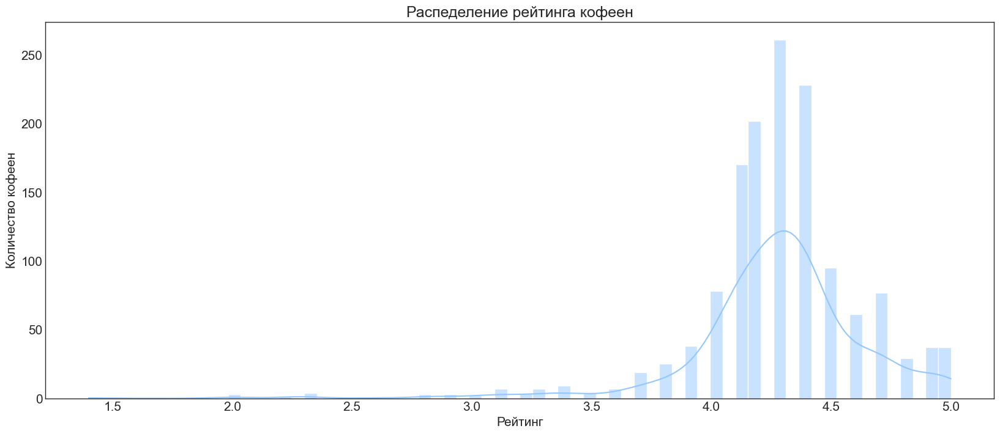

In [563]:
plt.rcParams['font.size'] = '15'
plt.figure(figsize=(20, 8))
sns.histplot(data=moscow_places.query('category == "кофейня"')
, x='rating', kde=True)
plt.title('Распеделение рейтинга кофеен')
plt.xlabel('Рейтинг')
plt.ylabel('Количество кофеен');

In [564]:
# создадим столбец для категоризации кофейни в зависимости от рейтинга
moscow_places['rating_category'] = pd.cut(
                                moscow_places['rating'], [0, 4.0, 4.4, np.inf],
                                labels=['4.0 и ниже', 'от 4.1 до 4.4', '4.5 и выше'])

#посчитаем медиану средней стоимости чашки кофе и seats отдельно по категория
grouped = moscow_places.query('category == "кофейня"').groupby('rating_category')
a = grouped[['middle_coffee_cup', 'seats']].median().reset_index()
a

,rating_category,middle_coffee_cup,seats
0,4.0 и ниже,126.0,94.0
1,от 4.1 до 4.4,173.0,80.0
2,4.5 и выше,170.0,70.0


In [565]:
fig = px.bar(a, 
             x='rating_category', 
             y='middle_coffee_cup',
             color='rating_category',
             text='middle_coffee_cup',
             range_y=[100, 180]
            )

fig.update_layout(title='Медианное значение стоимости чашки кофе в зависимости от рейтинга кофейни',
                   xaxis_title='Рейтинг кофейни',
                   yaxis_title='Медиана стоимости чашки капучино',
                 showlegend=False)
fig

Медианная стоимость чашки капучино в кофейнях Москвы 170 рублей. Кофейни, которые мы определили как наименее популярные у клиентов (рейтинг 4 и ниже) имеют медиану стоимости чашки кофе - 126 рублей. Средние кофейни (с оценкой от 4.1 до 4.4) и пользующие популярность (с рейтингом 4.5 и выше) имеют схожую стоимость чашки капучино - 173 и 170 рублей соответственно.

In [566]:
fig = px.bar(a, 
             x='rating_category', 
             y='seats',
             color='rating_category',
             text='seats',
             range_y=[60, 100]
            )

fig.update_layout(title='Медианное значение количества посадочных мест в зависимости от рейтинга кофейни',
                   xaxis_title='Рейтинг кофейни',
                   yaxis_title='Медиана количества посадочных мест',
                 showlegend=False)
fig

Анализ медианного значения количества посадочных мест в кофейне в зависимости от рейтинга показал закономерность - чем выше рейтинг кофейни, тем чаще количество посадочных мест в заведении не большое. Так в кофейнях с рейтингом менее 4.0 медианное значение количества мест для гостей - 94, в заведениях со средней оценкой - 80 мест, а в кофейнях с высоким рейтингом количество посадочных мест в медиане 70.

In [567]:
# посмтроим график взаимосвязи рейтинга кофейни и количества посадочных мест в ней 
c = moscow_places.query('category == "кофейня"')

# строим scatter
fig = px.scatter(c,             
                 x='seats', 
                 y="rating") 


fig.update_layout(title='Взаимосвязь рейтинга кофейни и количества посадочных мест',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Рейтинг',
                   xaxis_range=[0, 700]
                )

fig.show()

Для кофеен с ретингом до 4.0 не наблюдается какой-то закономерности в распределении количества посадочных мест. Кофейни с рейтингом от 4.1 до 4.4 в большинстве имеют до 160 посадочных мест. Заведения с рейтингом выше 4.5 имеют до 60 посадочных мест или 80-100 мест. Можно предположить, что небольшой размер популярных заведений придает им камерности и уютности, что нравится гостям. 

In [568]:
moscow_places.query('category == "кофейня" & rating >=4.5')['name'].count()

336

In [569]:
moscow_places.query('category == "кофейня" & rating >=4.5 & chain == 1')['name'].count()

102

Всего в датафрейме 1413 кофеен, из них высокий рейтинг имееют 336 кофеен, 102 из которых сетевые, т.е. чуть меньше трети успешных кофеен - сетевые. Посмотрим на карте, где расположены кофейни с рейтингом 4.5 и выше.

In [570]:
top_kofein = moscow_places.query('category == "кофейня" & rating >=4.5')

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
top_kofein.apply(create_clusters, axis=1)

# выводим карту
m

Больше всего плотность расположения кофеен, которые нравятся людям, т.е. с рейтингом 4.5 и выше, в Замоскворечье. Это 12 заведений из 36 кофеен, которые располагаются в том районе.

## Выводы и рекомендации для "кофеен"

Кофейни занимают значительную часть (16,8%) заведений общественного питания в Москве, у клиентов есть интерес к подобного рода заведениям. Среди популярных сетевых заведений кофейни занимают первое место, их доля 40%. Чуть более половины кофеен в выборке - сетевые. Потенциально, кофейня - это востребованный и масштабируемый формат заведения.
- возможная успешная локализация для будущей кофейни - Центральный АО, района Замоскворечье. В этом районе  36 кофеен, треть из которых успешные (рейтинг 4.5 и выше), ни одна другая локация даже с большей плотностью расположения кофеен не имеет такой доли успешный заведений;
- оптимальное количество посадочных мест - 50-60 или 80-100 мест;
- рекомендованная стоимость чашки капучино - 170-190 рублей;
- режим работы, предполагающий круглосуточный формат не является критичным при определении успешности кофейни;
- перед открытие важно доисследовать востребованность кофеен в другие сезоны года и параметры, по которым клиенты ставят свою оценку заведению в виде рейтинга. Эти критерии могут стать основой построения успешного формата будущего заведения.